# Artist Profiles

# Purpose: 
<h4 style='margin-bottom: 1;'> Building on our analysis of Country Music, this script takes a closer look at 40 popular Country artists (each with at least 5 songs) through wordclouds and radar charts, revealing the unique lyrical themes that define their music. </h4>

![Alt text](Images/Artist_Profiles_Scope.png)

# Featured Songs
## [Playlist: Click Here to Access via Spotify](https://open.spotify.com/playlist/6wS1RaOrTQiwlNTOuFyJcx?si=686ab2a0fa4444f0)

![Alt text](Images/Playlist_A.png)

![Alt text](Images/Playlist_B.png)

![Alt text](Images/Playlist_C.png)

# Initial Setup

In [1]:
# Import Required Libraries
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
import random
import nltk

# Import Specific Functions
from nltk.corpus import stopwords
from wordcloud import WordCloud
from PIL import Image

# Ignore All Warnings 
warnings.filterwarnings('ignore')

# Download NLTK Files Only If They Haven't Been Downloaded Already
nltk.download('stopwords', quiet = True)

# Define the custom color palette
primary_color = '#C00000'  # Primary color
secondary_colors = ['#8D4F00', '#400200']  # Secondary colors

# Color function
def custom_colors(word, **kwargs):
    # Prioritize primary color with a higher probability
    colors = [primary_color] * 2 + secondary_colors
    return random.choice(colors)

# Framework of Country Themes

![Alt text](Images/Themes.png)

### Load Cleaned Lyrics Analysis - Lyrics in Context Sheet

In [2]:
# Load Cleaned Data with Lyrics from Featured Songs Cleaned and Classified
lyrics_categorized = pd.read_excel('Data/Lyrics_Analysis_Cleaned.xlsx', sheet_name = 'Lyrics_in_Context')

# Convert Release_Date to DateTime
lyrics_categorized['Release_Date'] = pd.to_datetime(lyrics_categorized['Release_Date'])

# Define Stopwords and Irrelevant Words
stop_words = set(stopwords.words('english'))
irrelevant_words = {"dont", "got", "im", "aint", "yeah", "gonna", "youre", "cant", "like", "get", "back", "one",
                    "take", "know", "thing", "around", "ive", "I'll", "em", "theres", "ooh", "lets", "yeah",
                    "let", "go", "whoa", "oh", "even", "well", "'cause", "side", "tell", "we're", "thats",
                    "said", "hey", "round", "way", "hes", "bout", "many", "say", "took"}

# Combine Stopwords with Irrelevant Words
all_stopwords = stop_words.union(irrelevant_words)

# Filter out Stopwords
lyrics_categorized = lyrics_categorized[~lyrics_categorized['Word'].isin(all_stopwords)]

lyrics_categorized.head()

,Song_Title,Release_Date,Artist_List,Hometown,Word,Line_Number,Original_Line,Classification,Cnt_of_Word
1306,Highwayman,1985-03-29,"['Willie Nelson', 'Johnny Cash', 'Waylon Jenni...","['Abbott, Texas', 'Kingsland, Arkansas', 'Litt...",abide,9,And with the sea I did abide,Nature and the Environment,1
1307,Away From The Mire,2019-09-27,['Billy Strings'],"['Lansing, Michigan']",able,34,We'll be ready and able to fly,Freedom and Independence,1
1308,Too Far Gone,2023-04-28,['Evan Honer'],"['Surprise, Arizona']",able,28,I'd be able to feel something,"Emotions, Morals, and Mind",1
1420,All I See Is You,2015-09-11,['Shane Smith & the Saints'],"['Austin, Texas']",abroad,14,And I remember our first night abroad,"Age, Nostalgia, and Memory",1
1421,Before He Cheats,2005-11-14,['Carrie Underwood'],"['Checotah, Oklahoma']",acause,30,A-'cause the next time that he cheats,"Conflict, Struggle, and Perseverance",1


# Artist Profiles

## WordCloud and Radar Chart Function

In [3]:
# Define WordCloud and Radar Chart Function
def wordcloud_radar_visual(artist):
    
    # Filter Data for Specified Artist
    filtered_data = lyrics_categorized[lyrics_categorized['Artist_List'].apply(
        lambda artist_list: artist in artist_list
    )]

    # Apply Additional Filtering for Hank Williams, Because of Hank Williams Jr.
    if artist == "Hank Williams":
        filtered_data = filtered_data[filtered_data['Artist_List'].apply(
            lambda artist_list: "Hank Williams Jr." not in artist_list
        )]
    
    # Create a Dictionary with Words and Their Frequencies
    word_frequencies = filtered_data.groupby('Word')['Cnt_of_Word'].sum().to_dict()

    # Generate the WordCloud for all words
    wordcloud = WordCloud(
                            width = 800,
                            height = 400,
                            background_color = 'white',
                            color_func = custom_colors,
                            prefer_horizontal = 1.0,
                         ).generate_from_frequencies(word_frequencies)

    # Plot the WordCloud
    plt.figure(figsize = (10, 5))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.title(f'Wordcloud for {artist}', fontsize = 16)
    plt.show()

    # Group by Classifications and Sum up the Word Counts
    classification_counts = filtered_data.groupby('Classification')['Cnt_of_Word'].sum()

    # Sort by Frequency and Get the Top 5 Classification
    top_classifications = classification_counts.sort_values(ascending = False).head(5)

    # Get Classification Names and Their Counts
    categories = top_classifications.index.tolist()
    values = top_classifications.values.tolist()

    # Rotate the List so That the Top Classification is First
    categories = categories[-1:] + categories[:-1]
    values = values[-1:] + values[:-1]
    
    # Prepare Data for Radar Chart
    num_vars = len(categories)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint = False).tolist()
    angles = [angle + (np.pi / 10) for angle in angles]
    angles += angles[:1]
    values += values[:1]

    # Create Radar Chart
    fig, ax = plt.subplots(figsize = (6, 6), subplot_kw = dict(polar = True))
    ax.fill(angles, values, color = 'blue', alpha = 0.25)
    ax.plot(angles, values, color = 'blue', linewidth = 2)
    ax.set_yticks([])
    ax.set_xticks(angles[:-1])
    replacements = [
        ("and Perseverance", "\n and Perseverance"),
        ("and Memory", "\n and Memory"),
        ("and Mind", "\n and Mind"),
        ("and Religion", "\n and Religion"),
        ("and Money", "\n and Money"),
        ("and Celebration", "\n and Celebration"),
        ("and Jokes", "\n and Jokes"),
        ("and the Environment", "\n and the Environement"),
        ("and Gasoline", "\n and Gasoline"),
        ("and Roots", "\n and Roots"),
        ("Indulgence", "\n Indulgence"),
        ("Independence", "\n Independence"),
        ("Relationships", "\n Relationships"),
        ("Identities","\n Identities"),
    ]
    for old, new in replacements:
        categories = [label.replace(old, new) for label in categories]
    ax.set_xticklabels(categories, fontsize = 10, ha = 'center', va = 'center', y = -.1)
    ax.spines['polar'].set_visible(False)

    # Add Padding for the Title
    ax.set_title(f'Top 5 Classifications for {artist}', fontsize = 14, pad = 30)

    # Add Gridlines
    pentagon_radius = max(values)
    for i in [0.25, 0.5, 0.75, 1.0]:
        ax.plot(angles, [pentagon_radius * i] * len(angles), color = 'black', linewidth = 1)

    # Adjust Layout
    plt.tight_layout()

    # Show the Plot
    plt.show()

## Billy Strings

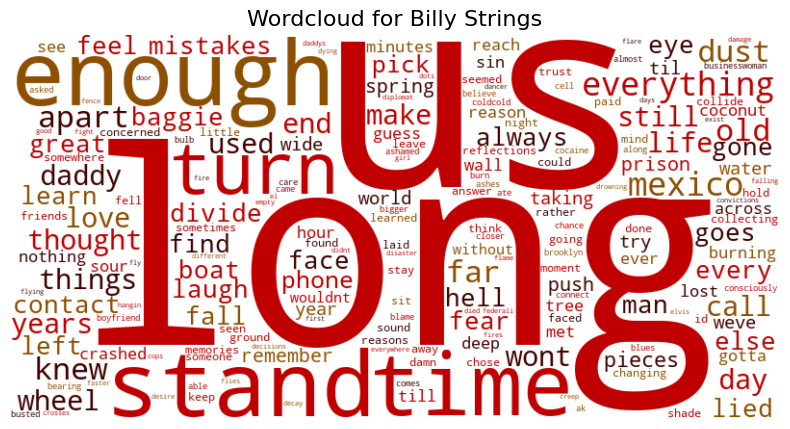

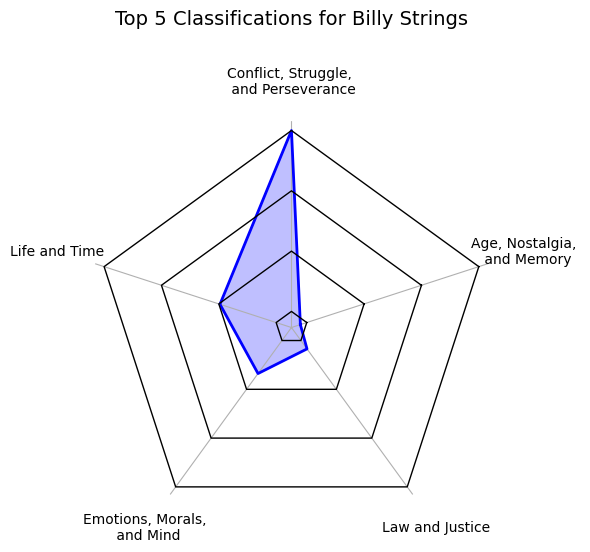

In [4]:
wordcloud_radar_visual('Billy Strings')

## Blake Shelton

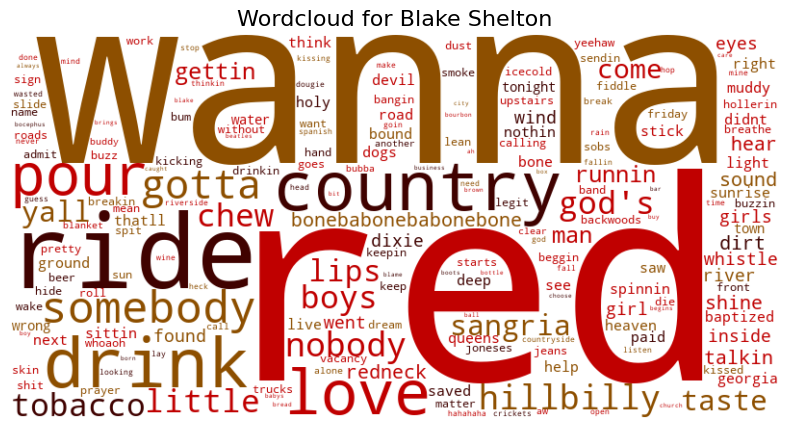

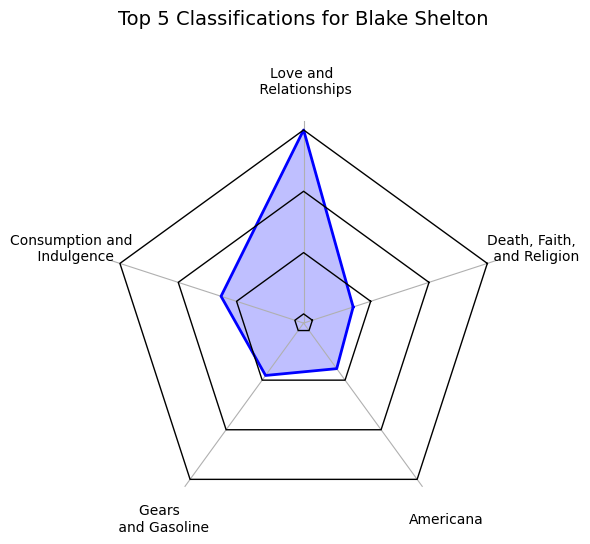

In [5]:
wordcloud_radar_visual('Blake Shelton')

## Brooks & Dunn

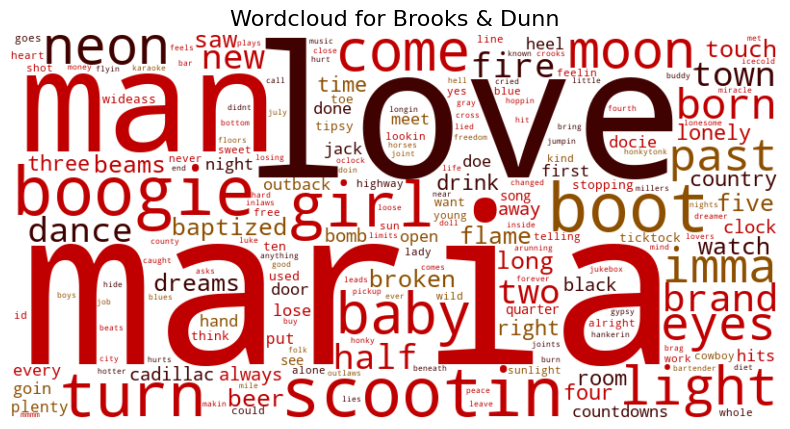

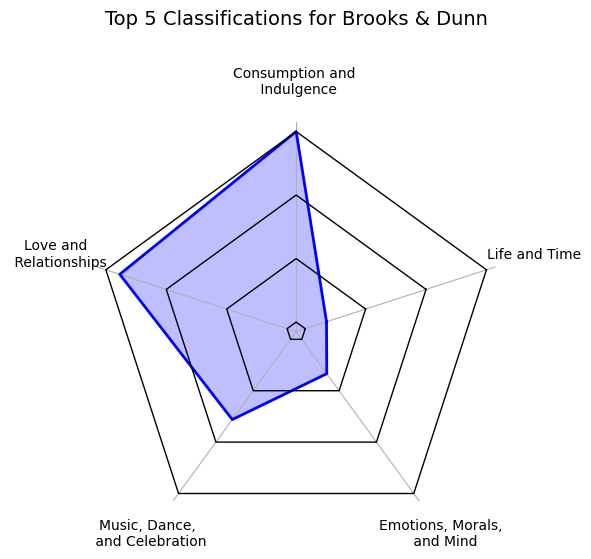

In [6]:
wordcloud_radar_visual('Brooks & Dunn')

## Carrie Underwood

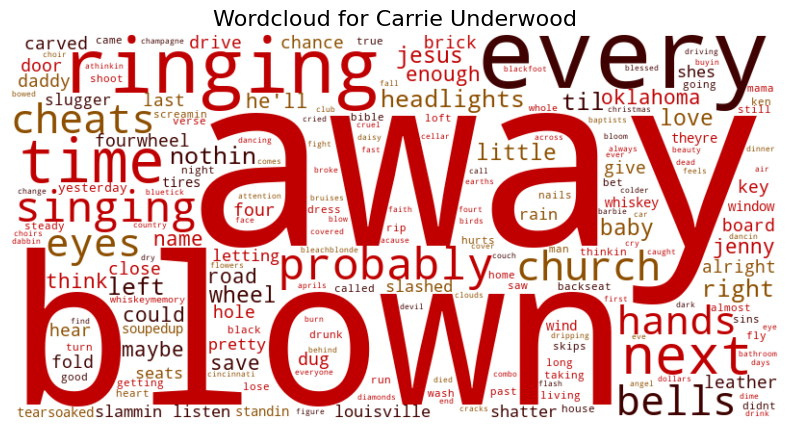

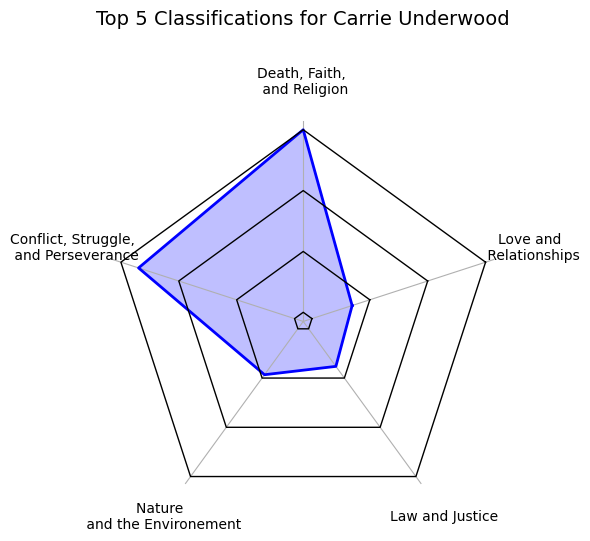

In [7]:
wordcloud_radar_visual('Carrie Underwood')

### Chris Stapleton

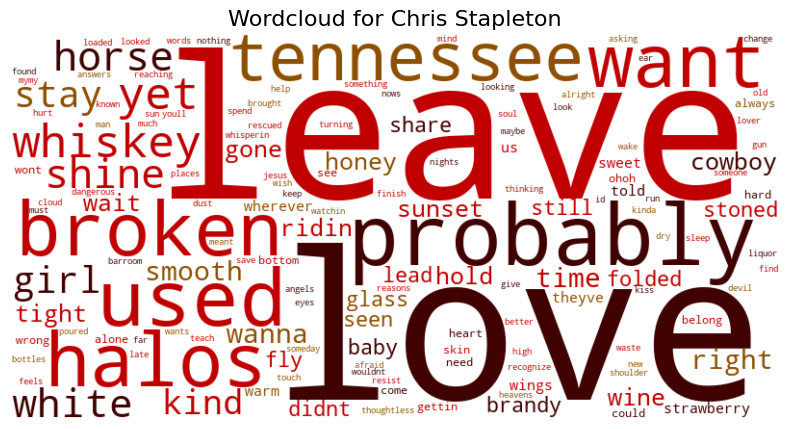

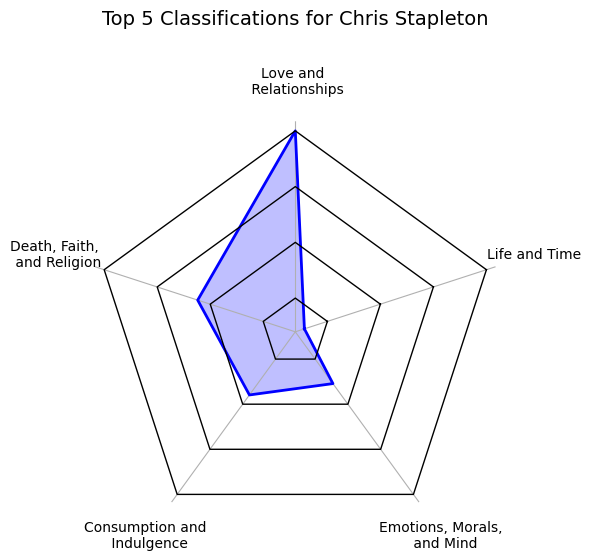

In [8]:
wordcloud_radar_visual('Chris Stapleton')

### Colter Wall

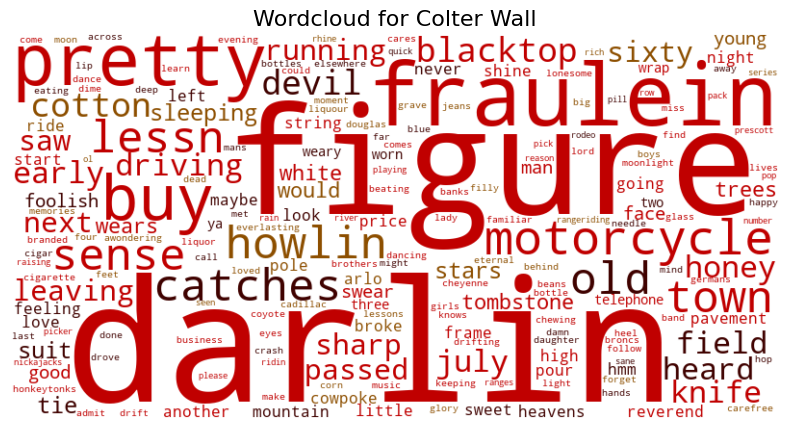

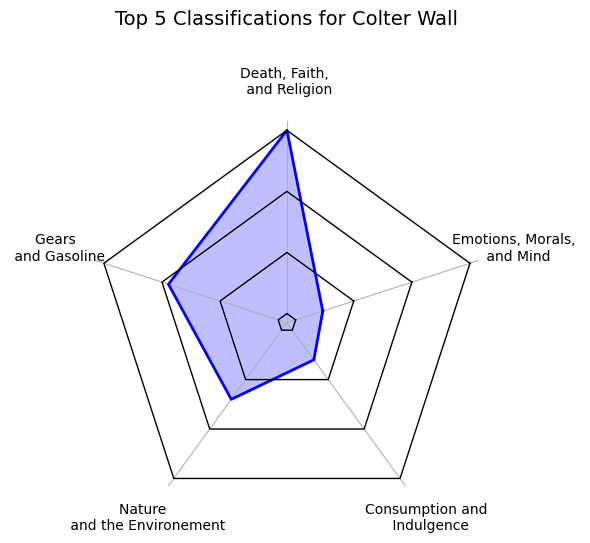

In [9]:
wordcloud_radar_visual('Colter Wall')

### Conway Twitty

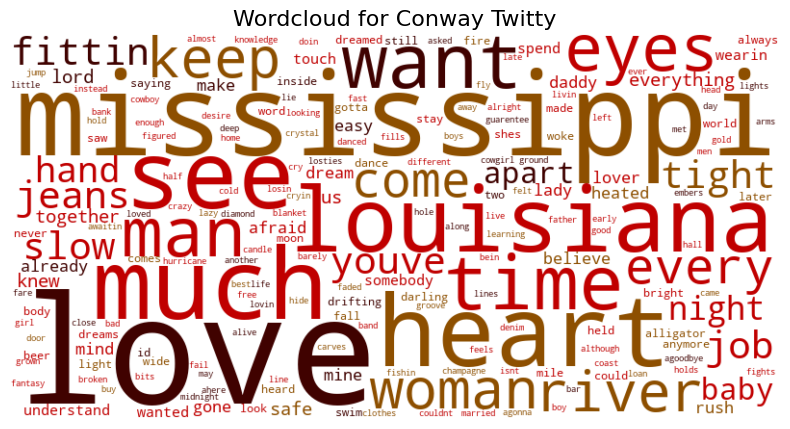

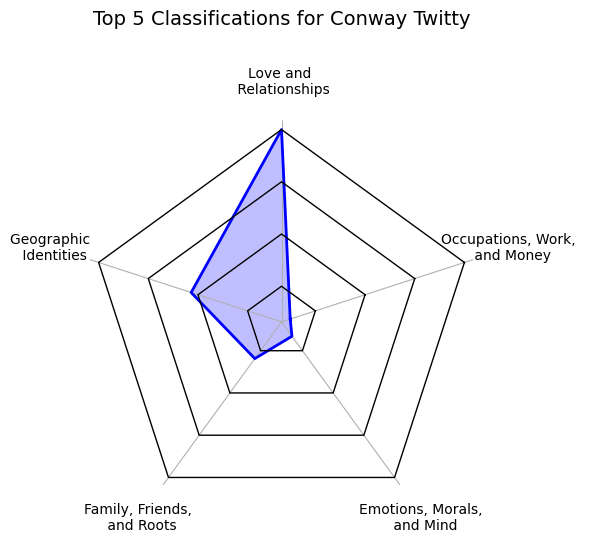

In [10]:
wordcloud_radar_visual('Conway Twitty')

### Dolly Parton

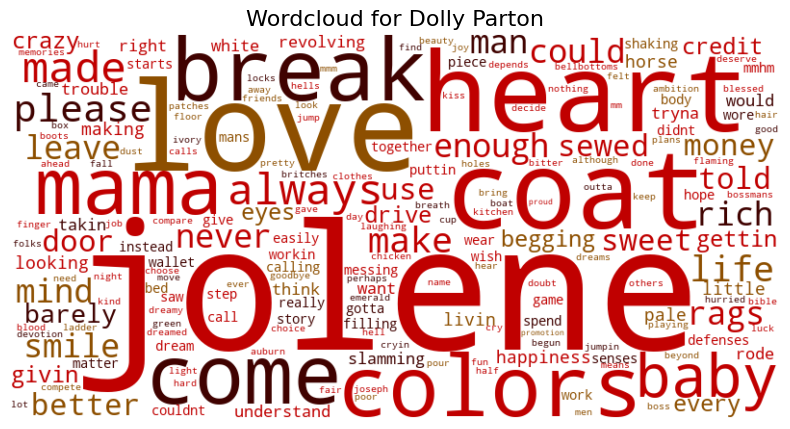

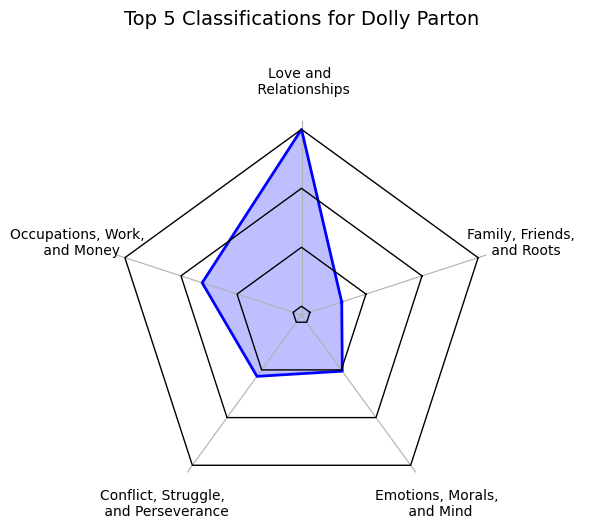

In [11]:
wordcloud_radar_visual('Dolly Parton')

### Dylan Gossett

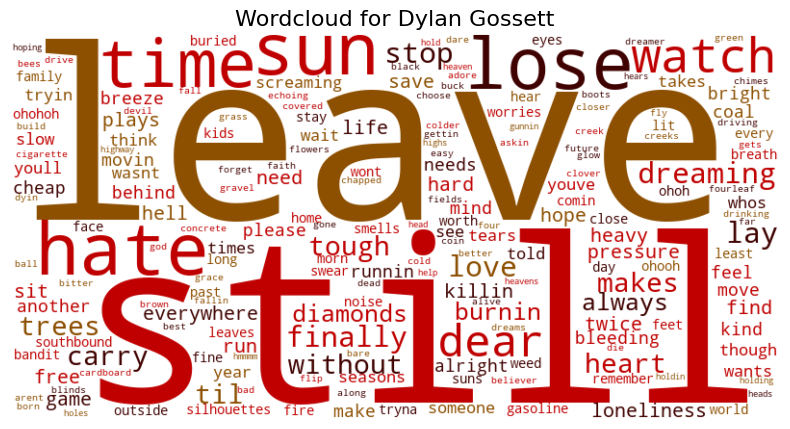

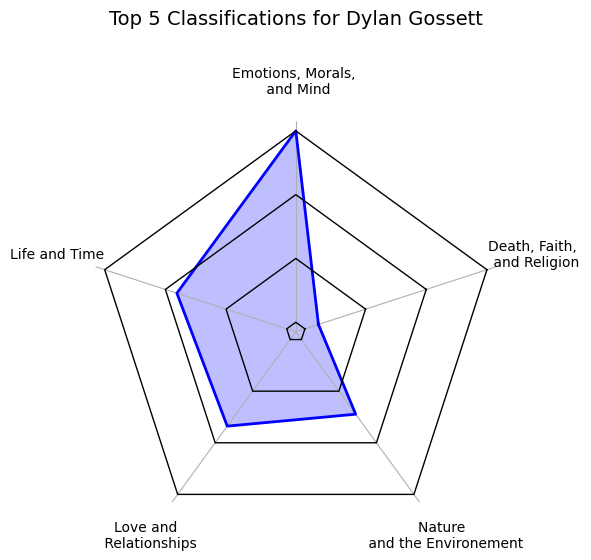

In [12]:
wordcloud_radar_visual('Dylan Gossett')

### Evan Honer

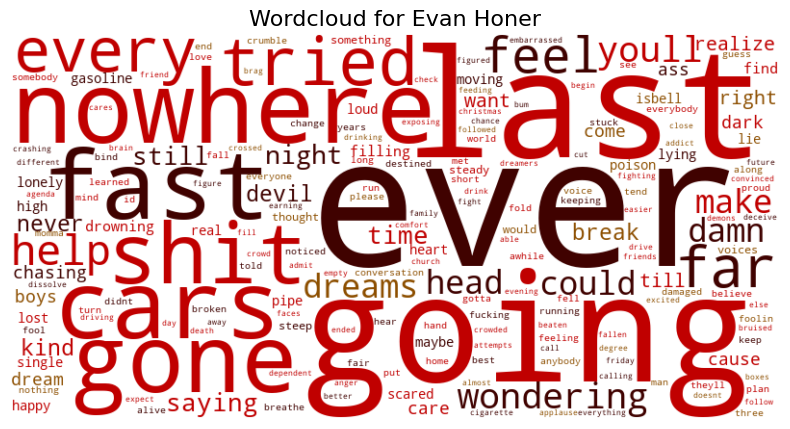

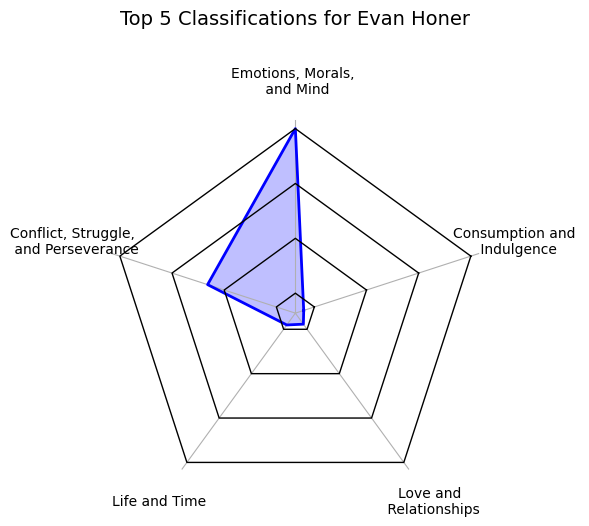

In [13]:
wordcloud_radar_visual('Evan Honer')

### Flatland Cavalry

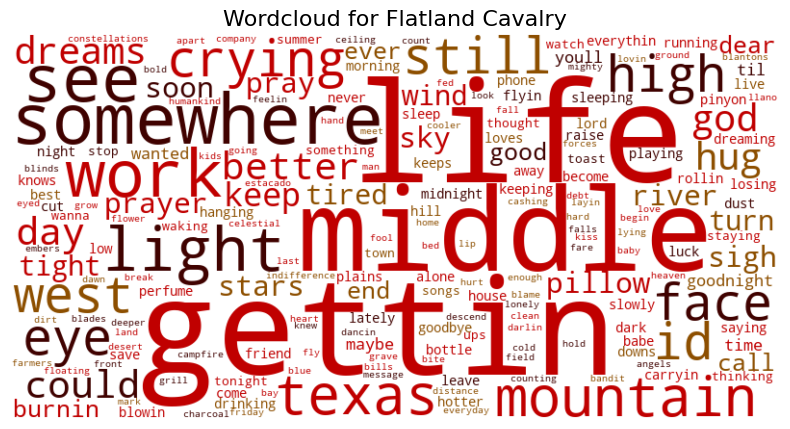

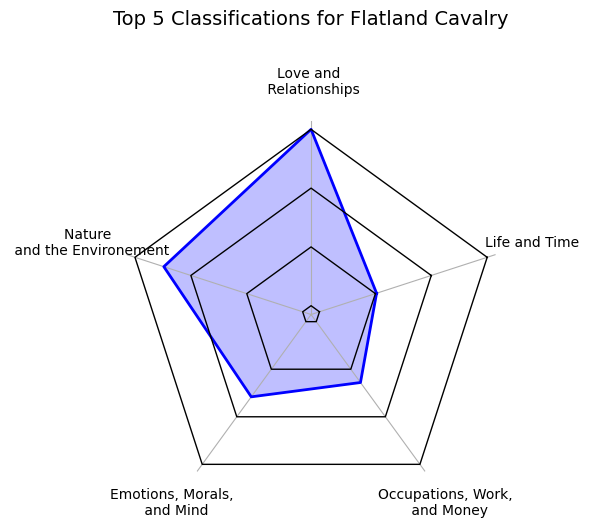

In [14]:
wordcloud_radar_visual('Flatland Cavalry')

### Garth Brooks

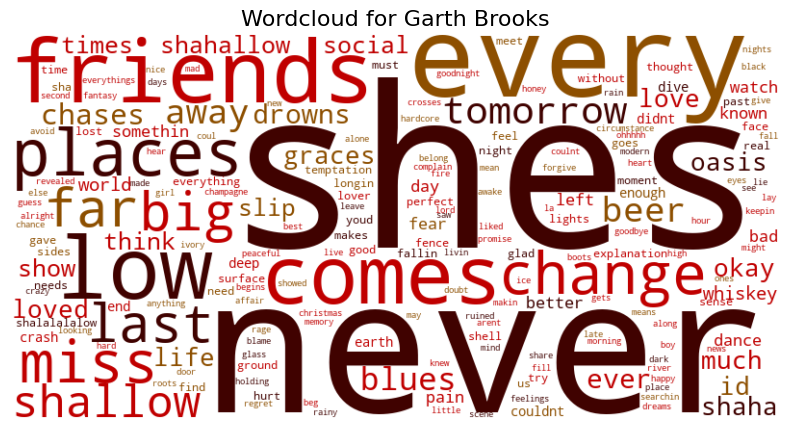

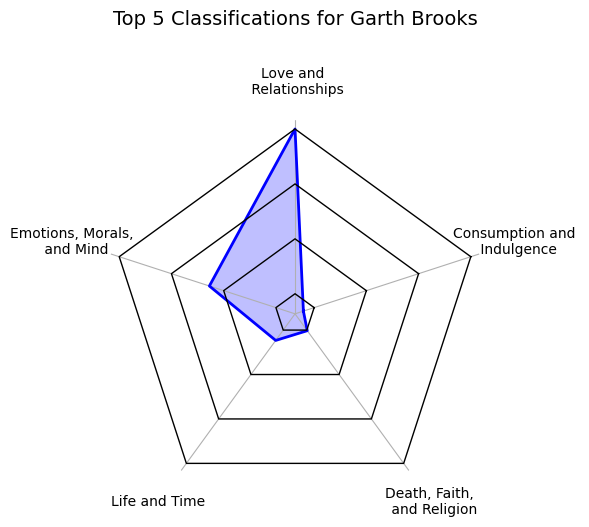

In [15]:
wordcloud_radar_visual('Garth Brooks')

### George Strait

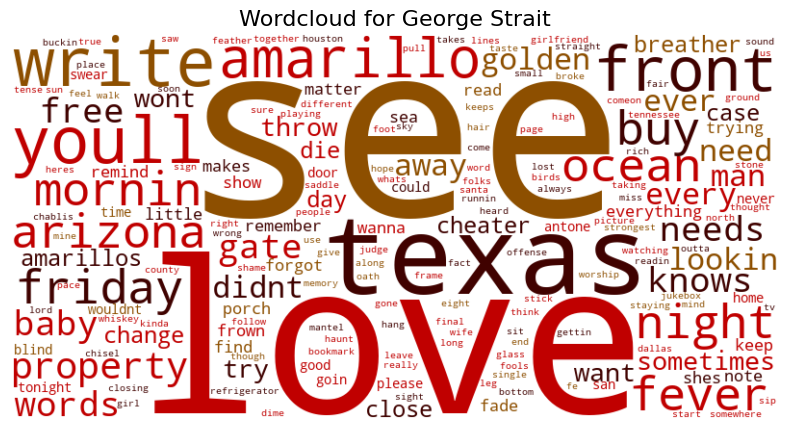

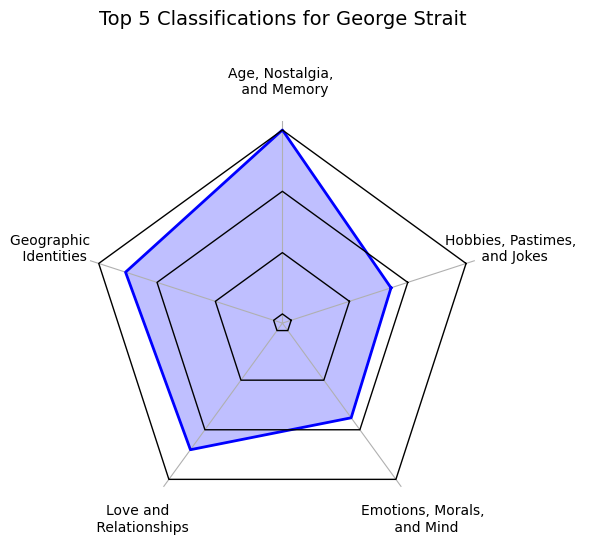

In [16]:
wordcloud_radar_visual('George Strait')

### Hank Williams

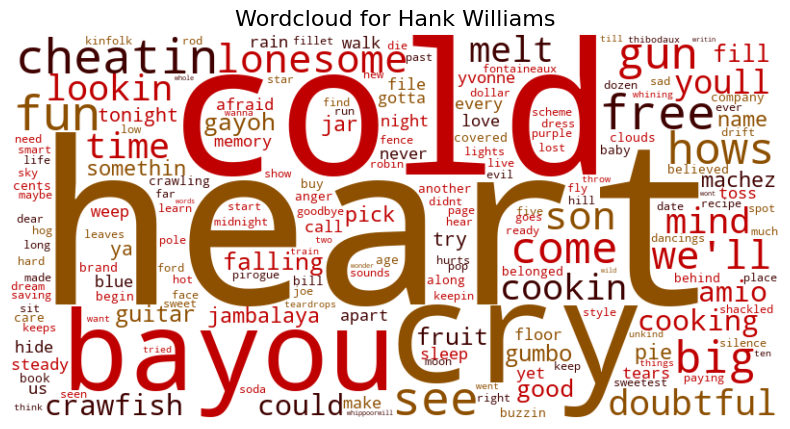

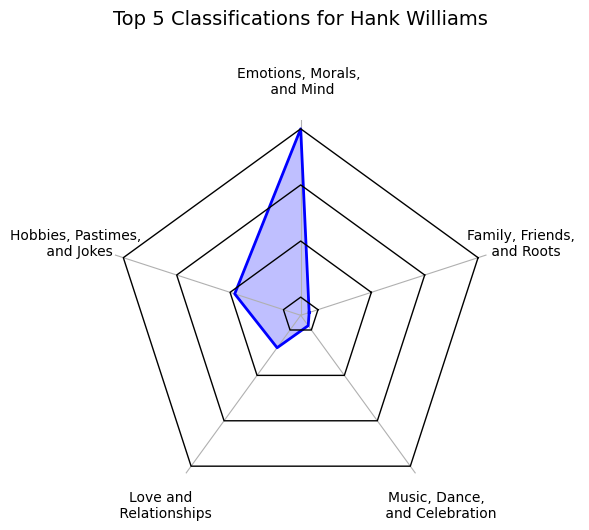

In [17]:
wordcloud_radar_visual('Hank Williams')

### Hank Williams Jr.

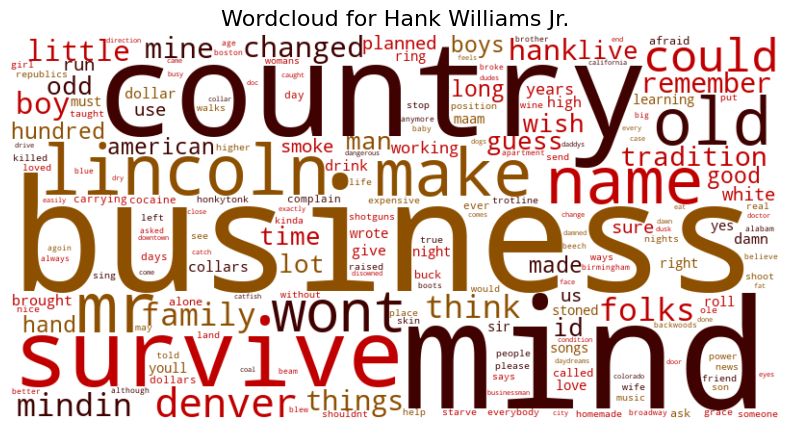

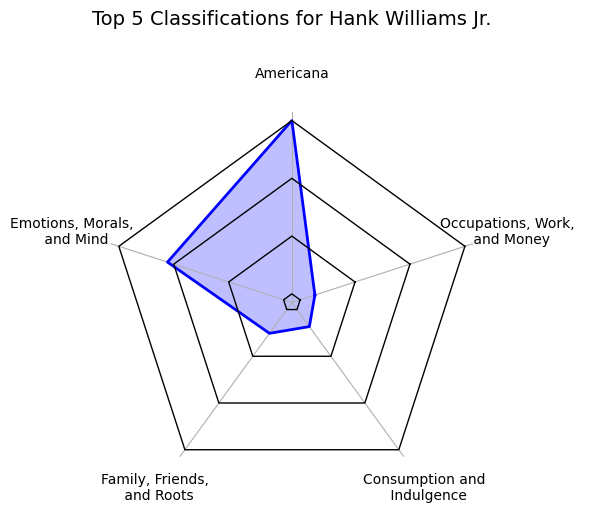

In [18]:
wordcloud_radar_visual('Hank Williams Jr.')

### Jelly Roll

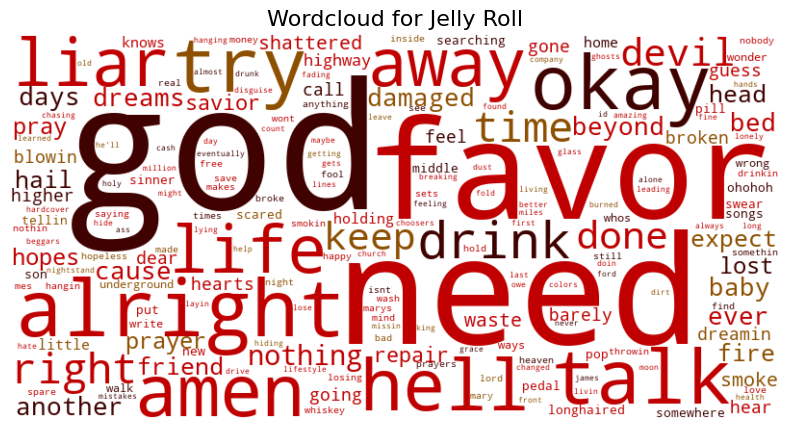

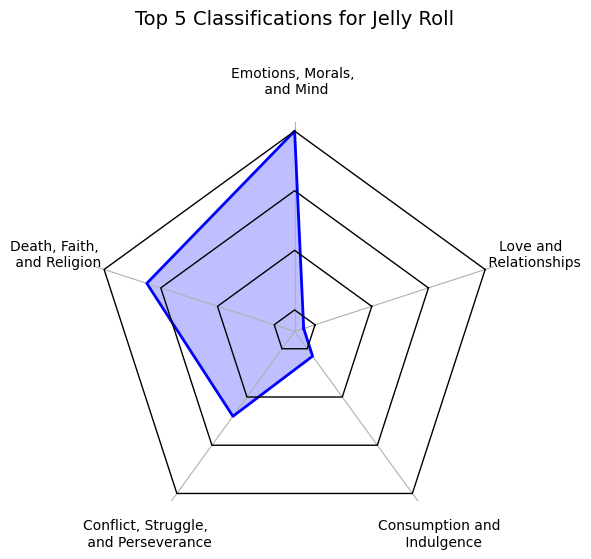

In [20]:
wordcloud_radar_visual('Jelly Roll')

### John Denver

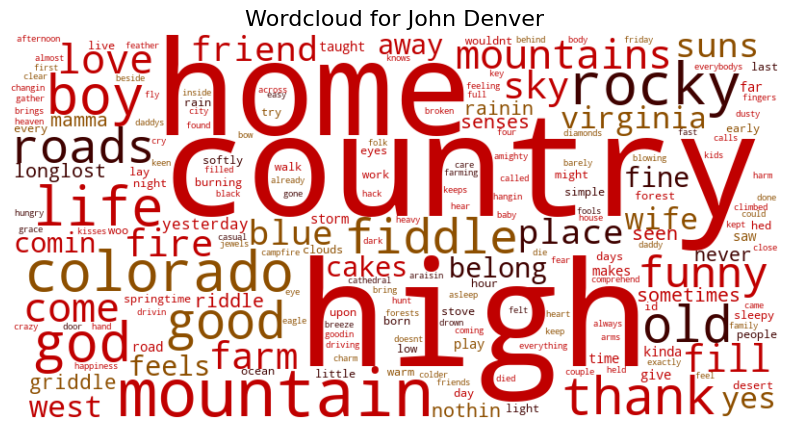

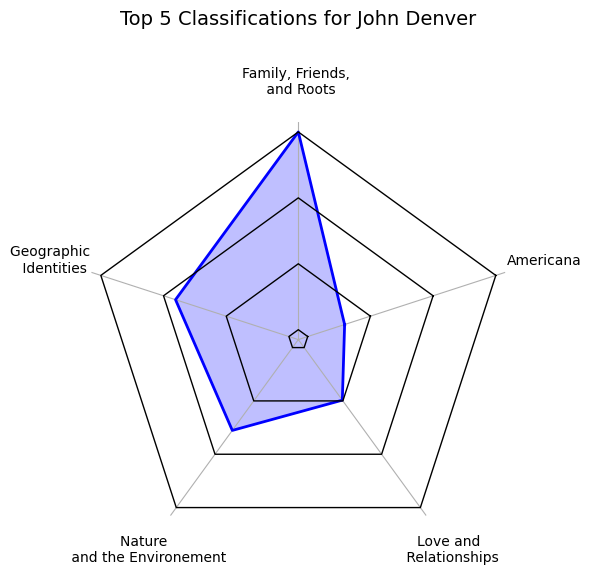

In [21]:
wordcloud_radar_visual('John Denver')

### Johnny Cash

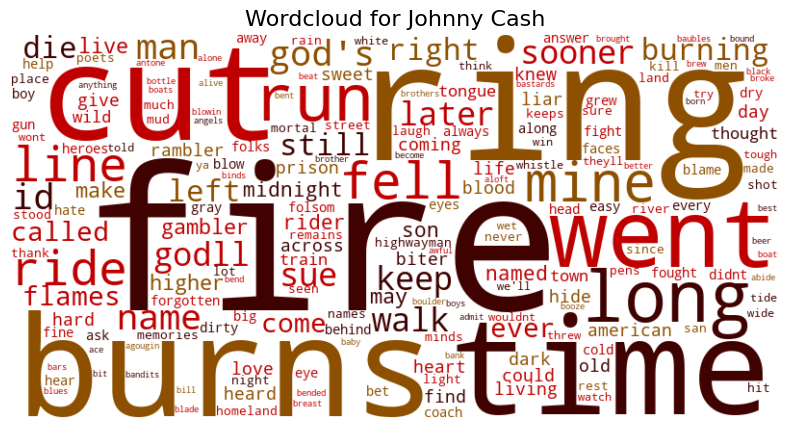

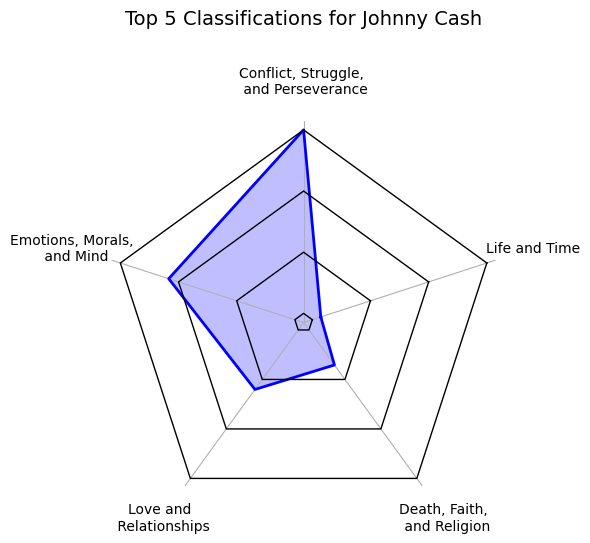

In [22]:
wordcloud_radar_visual('Johnny Cash')

### Jordan Davis

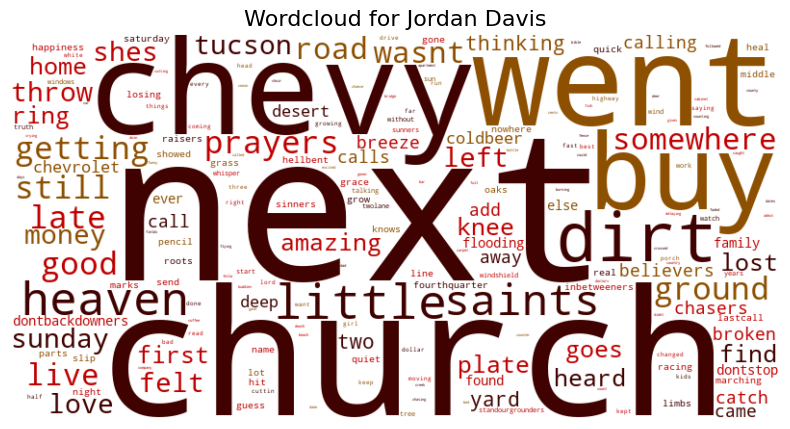

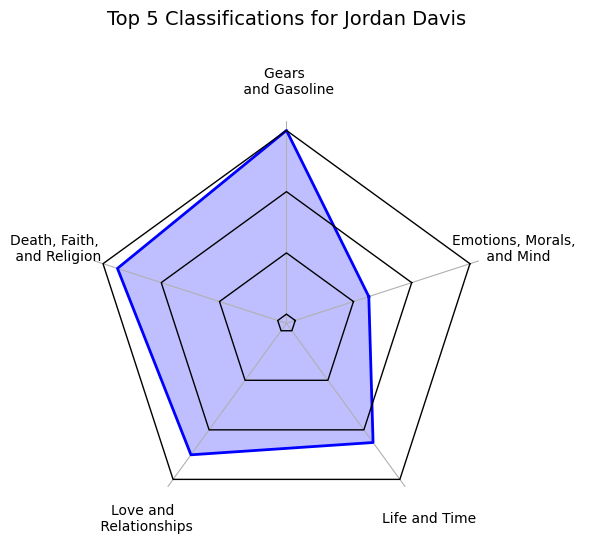

In [23]:
wordcloud_radar_visual('Jordan Davis')

### Josh Meloy

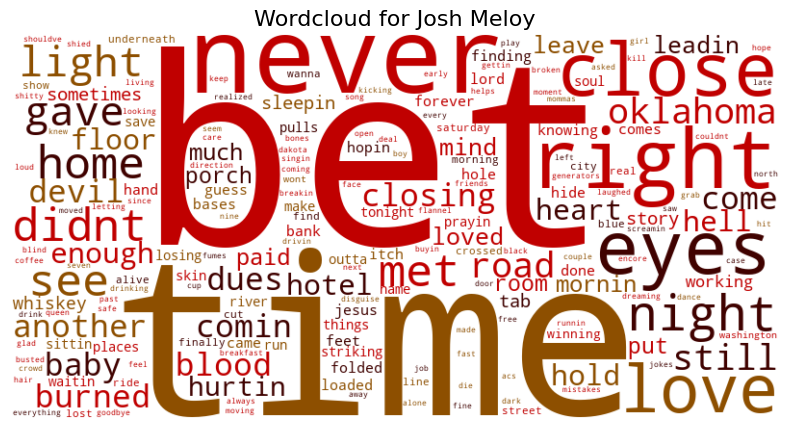

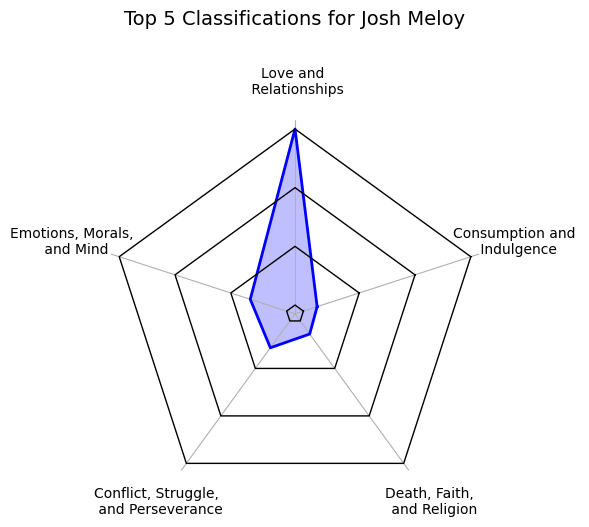

In [24]:
wordcloud_radar_visual('Josh Meloy')

### Justin Moore

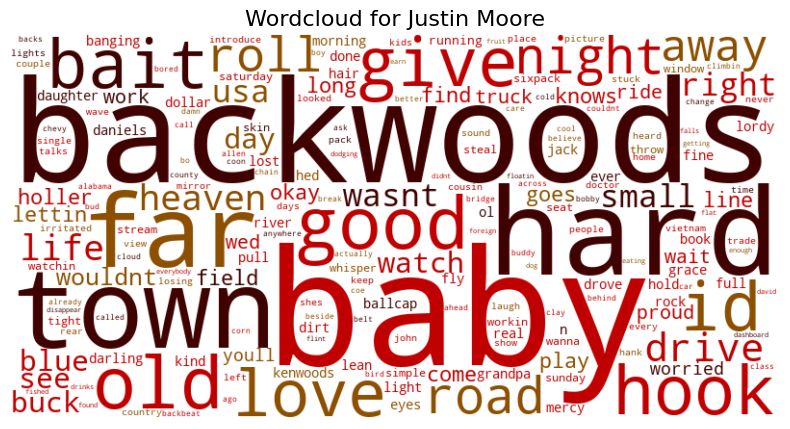

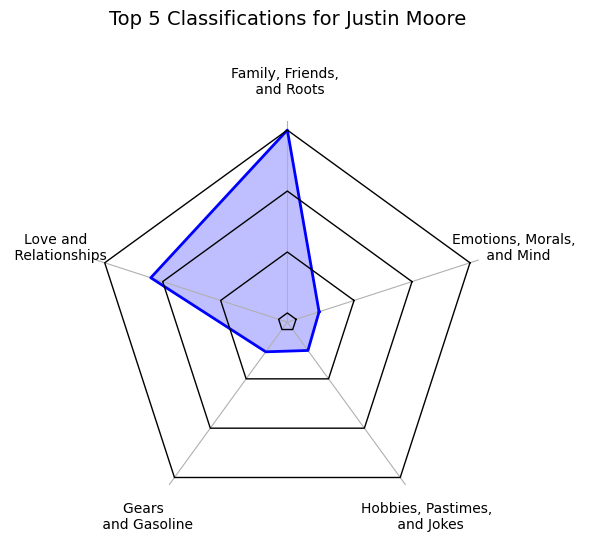

In [25]:
wordcloud_radar_visual('Justin Moore')

### Lainey Wilson

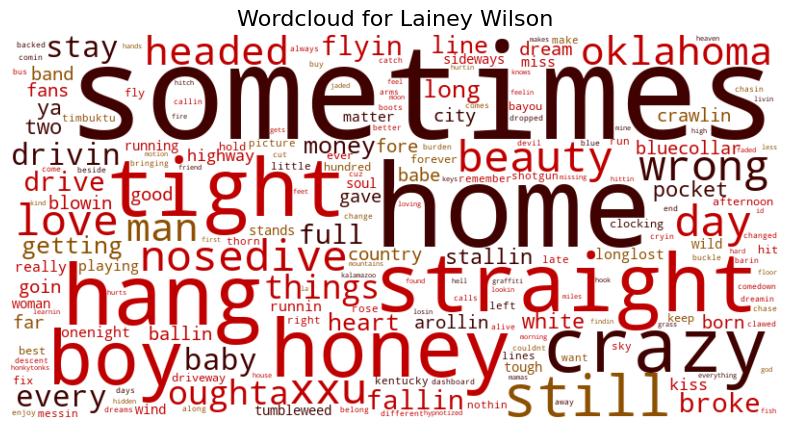

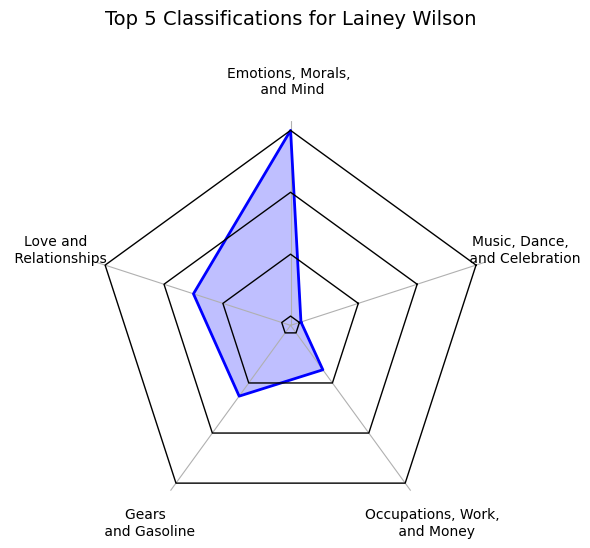

In [26]:
wordcloud_radar_visual('Lainey Wilson')

### Loretta Lynn

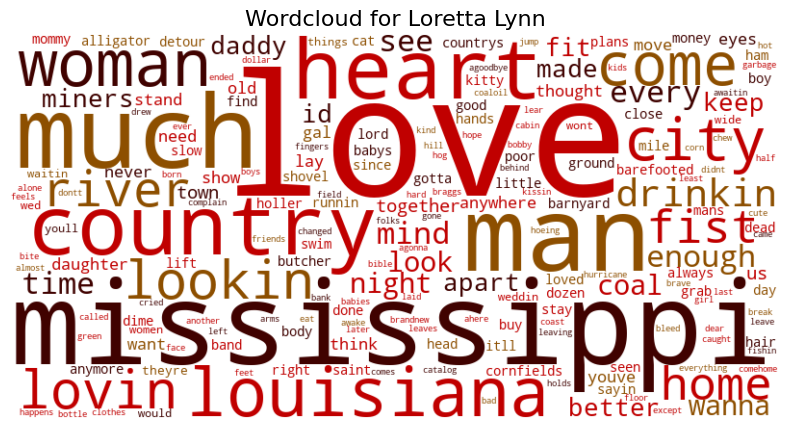

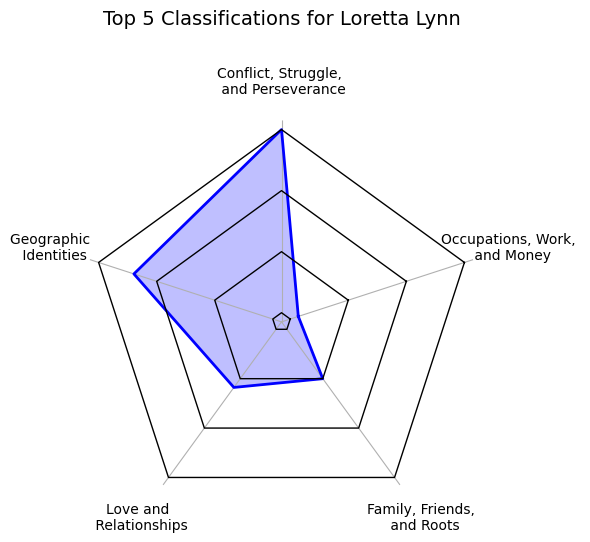

In [27]:
wordcloud_radar_visual('Loretta Lynn')

### Luke Combs

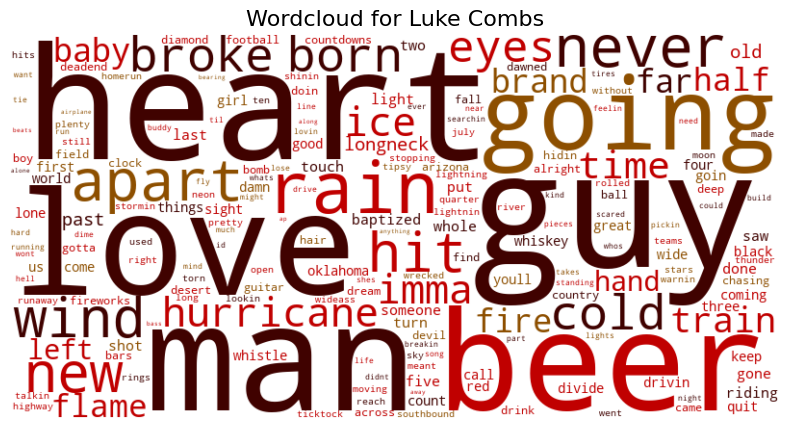

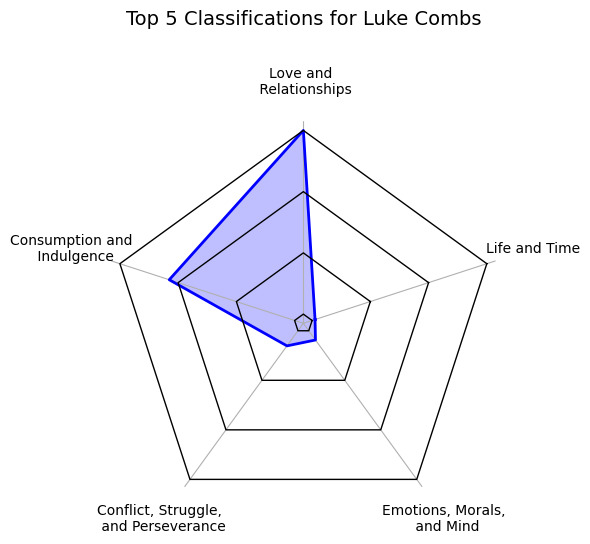

In [28]:
wordcloud_radar_visual('Luke Combs')

### Merle Haggard

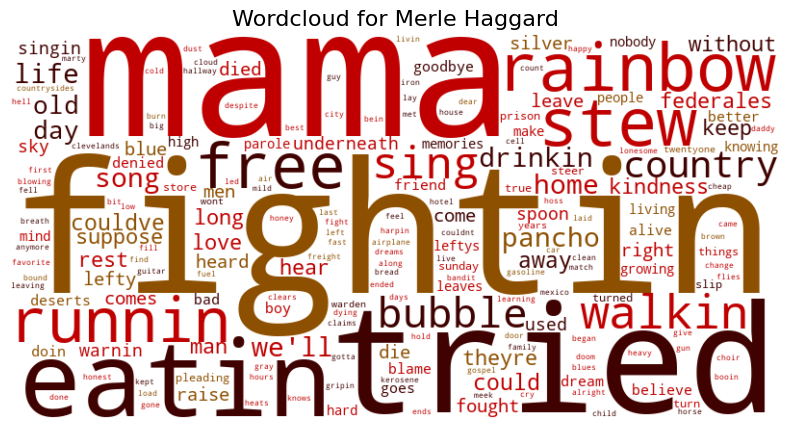

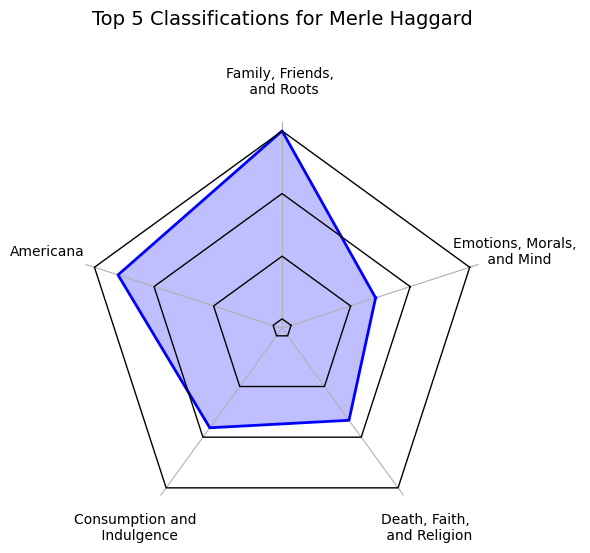

In [29]:
wordcloud_radar_visual('Merle Haggard')

### Morgan Wallen

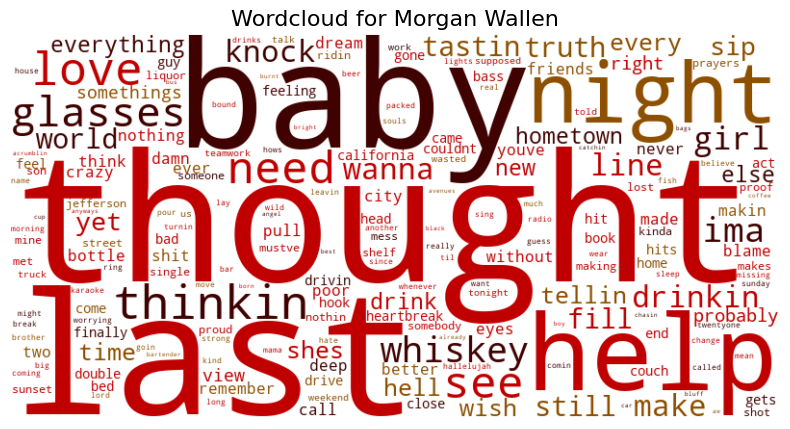

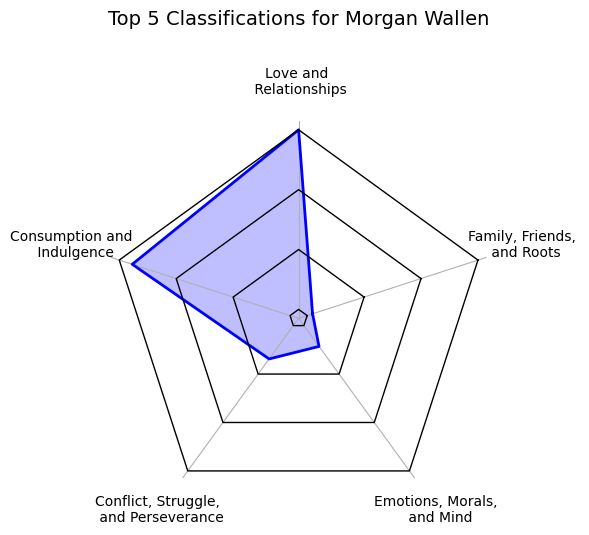

In [30]:
wordcloud_radar_visual('Morgan Wallen')

### Oliver Anthony

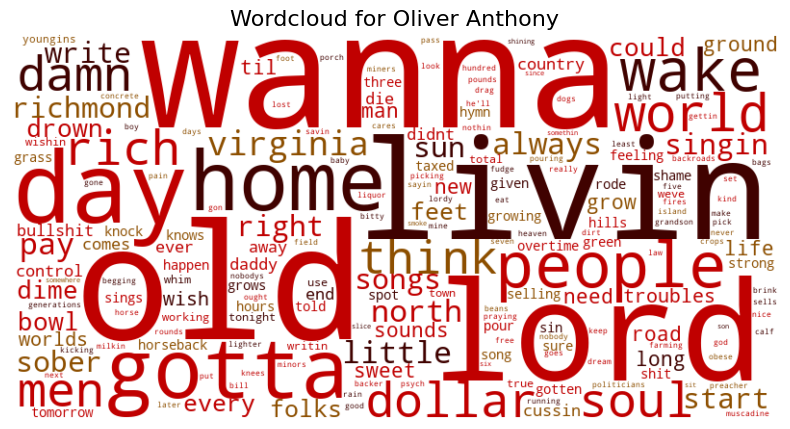

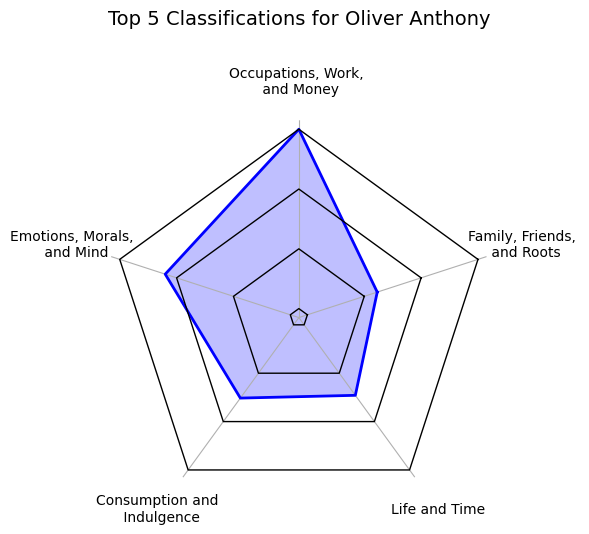

In [31]:
wordcloud_radar_visual('Oliver Anthony')

### Parker McCollum

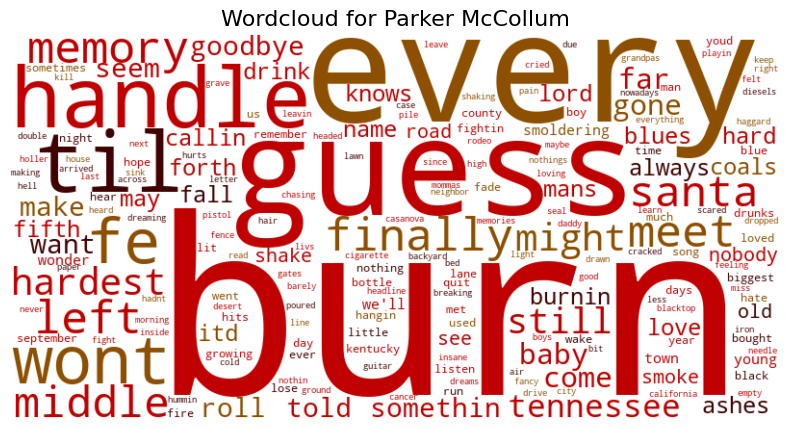

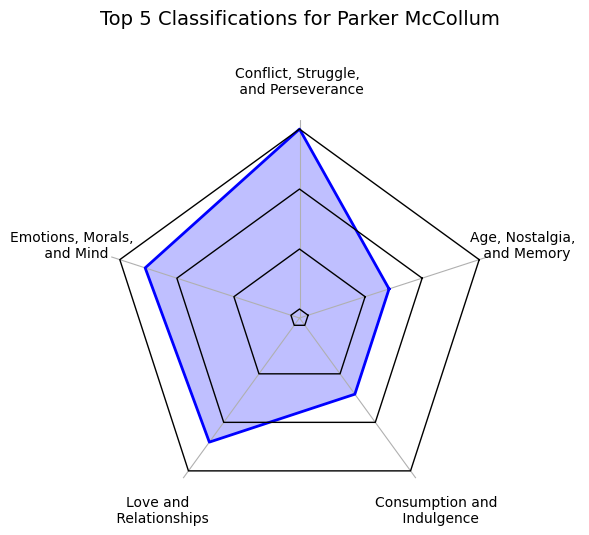

In [32]:
wordcloud_radar_visual('Parker McCollum')

### Patsy Cline

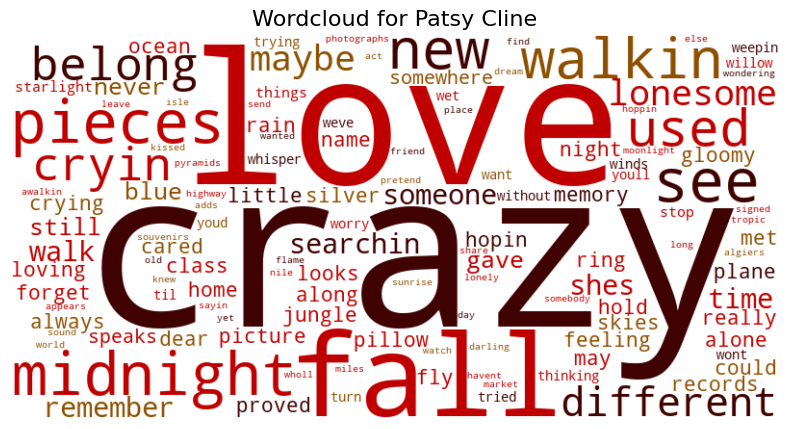

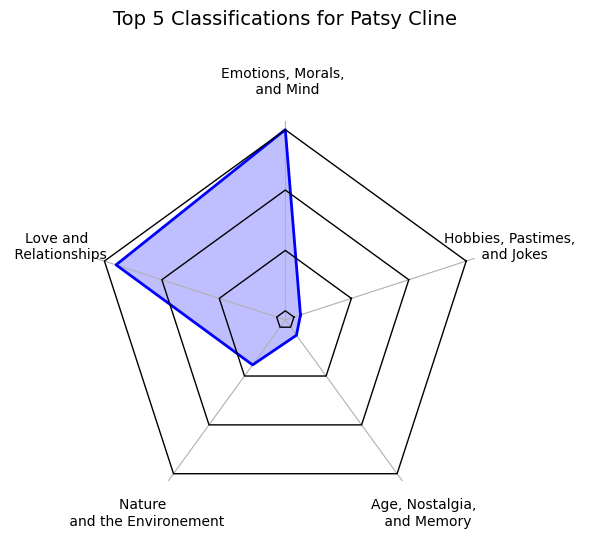

In [33]:
wordcloud_radar_visual('Patsy Cline')

### Post Malone

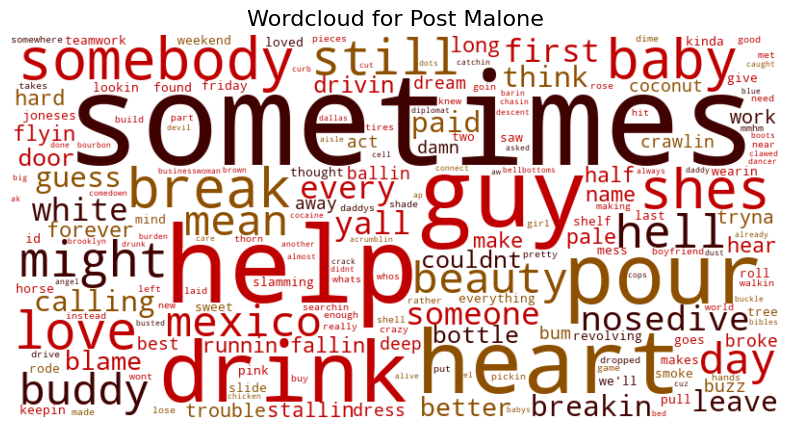

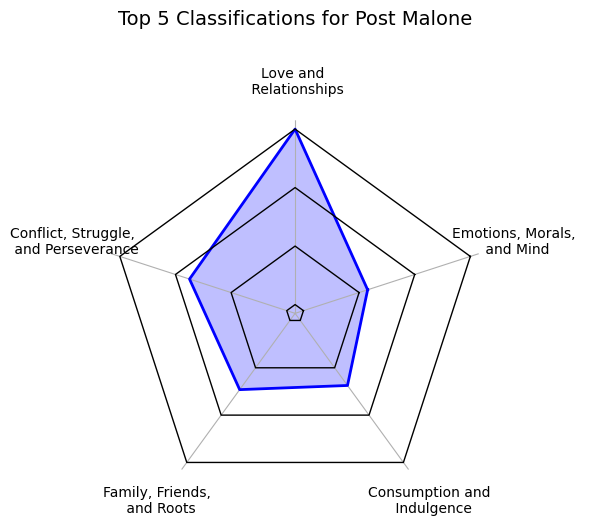

In [34]:
wordcloud_radar_visual('Post Malone')

### Randy Travis

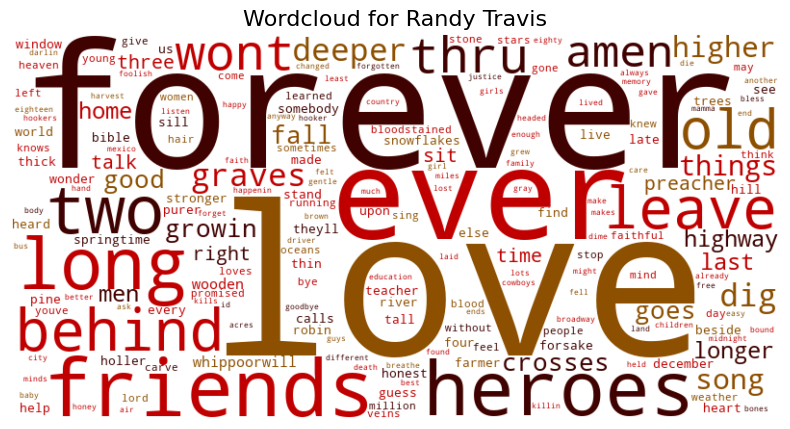

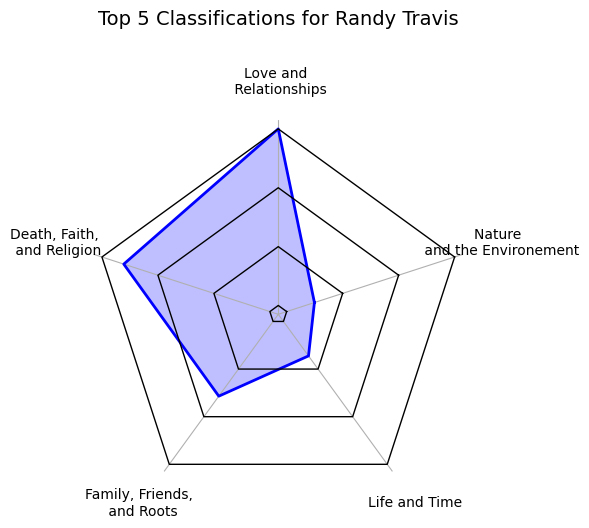

In [35]:
wordcloud_radar_visual('Randy Travis')

### Reba McEntire

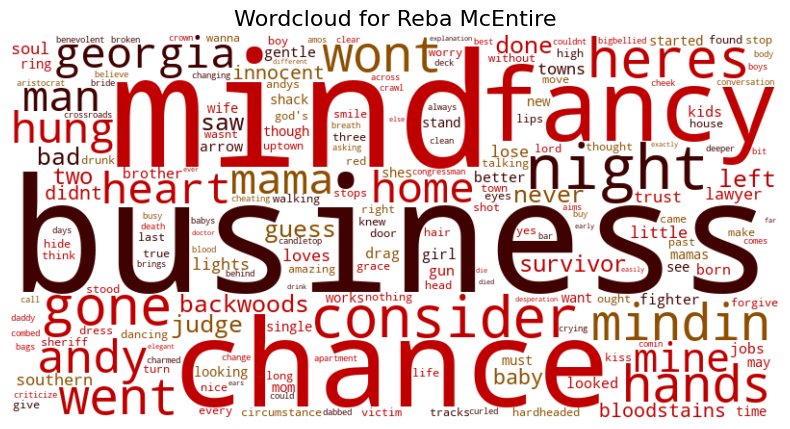

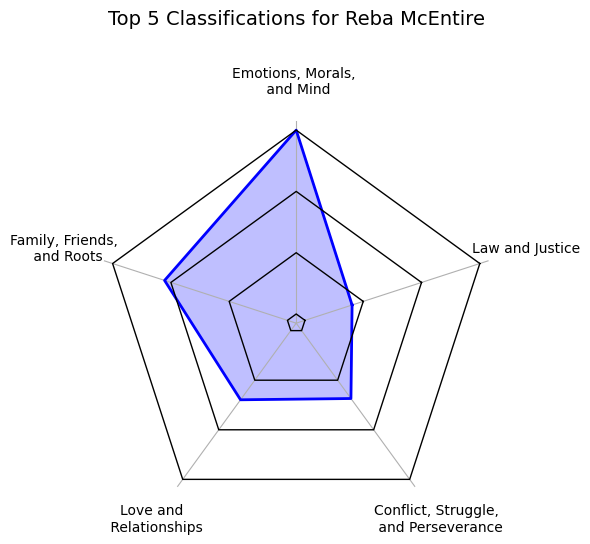

In [36]:
wordcloud_radar_visual('Reba McEntire')

### Shane Smith & the Saints

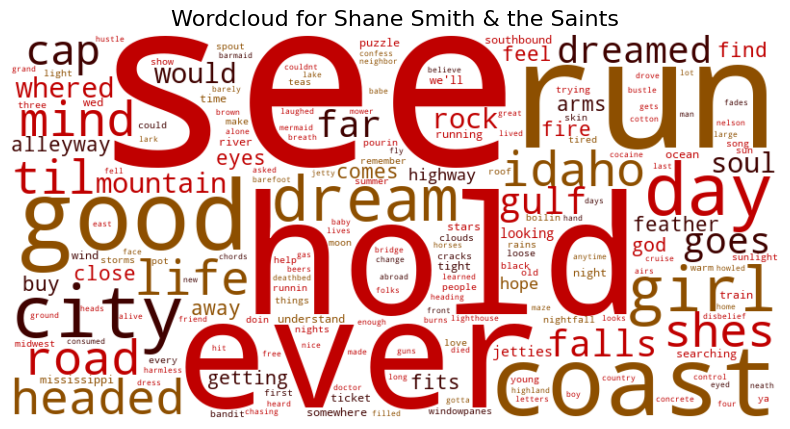

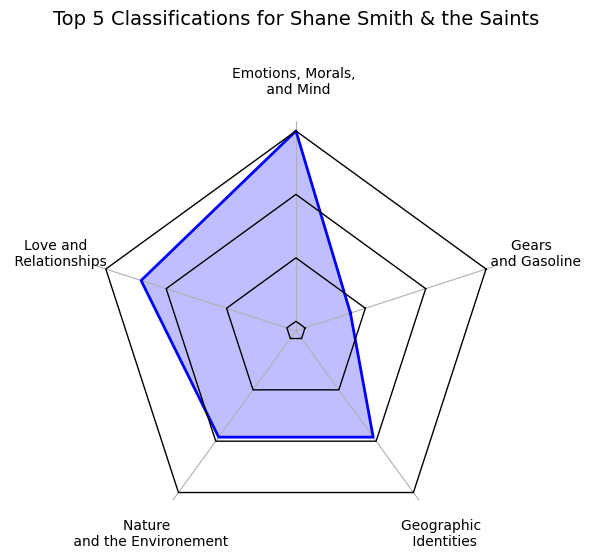

In [37]:
wordcloud_radar_visual('Shane Smith & the Saints')

### Sierra Ferrell

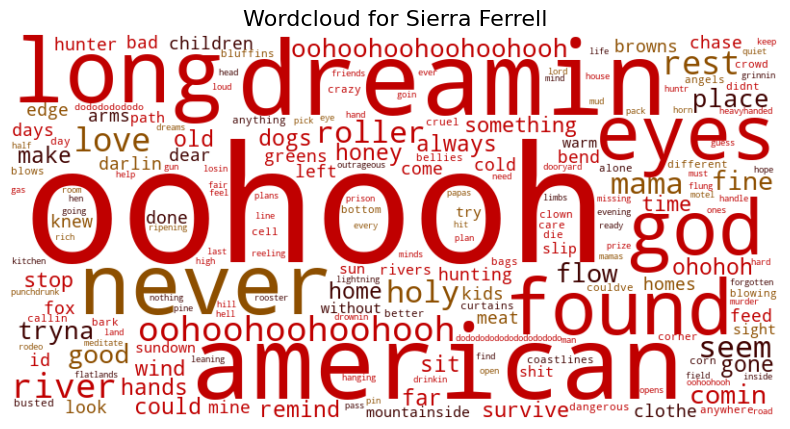

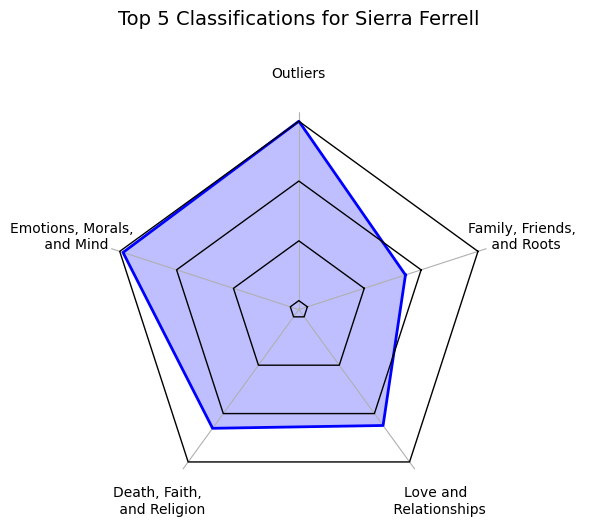

In [38]:
wordcloud_radar_visual('Sierra Ferrell')

### Sturgill Simpson

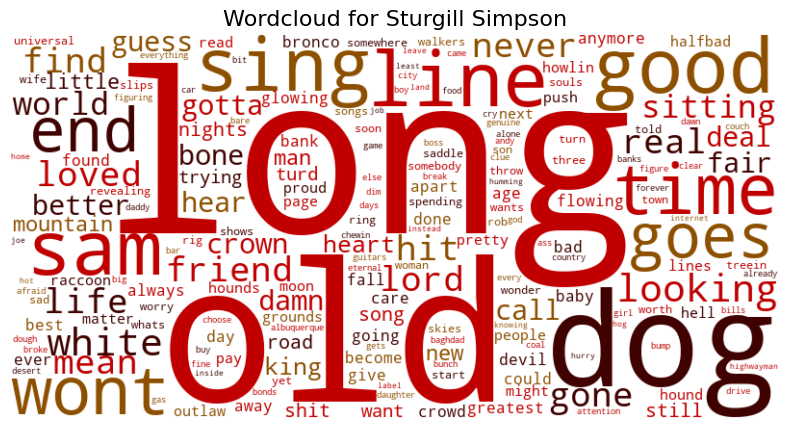

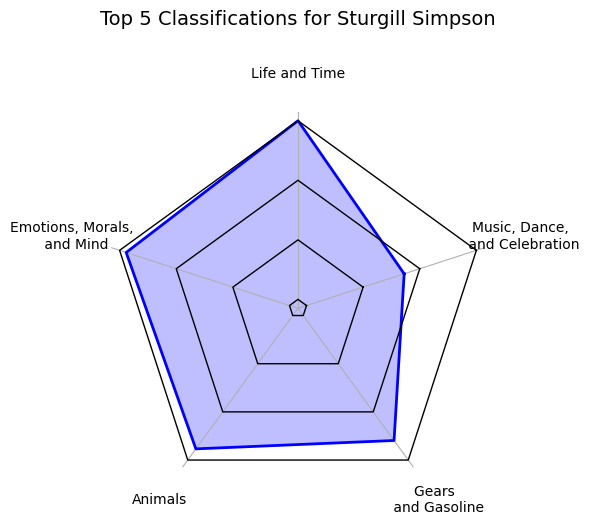

In [39]:
wordcloud_radar_visual('Sturgill Simpson')

### Tyler Childers

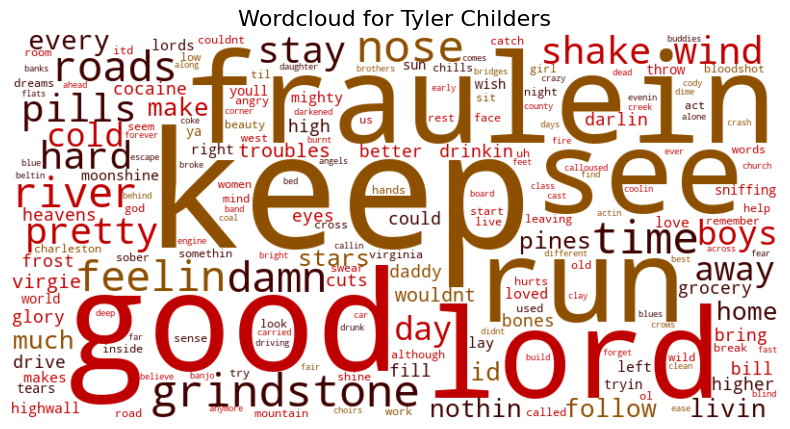

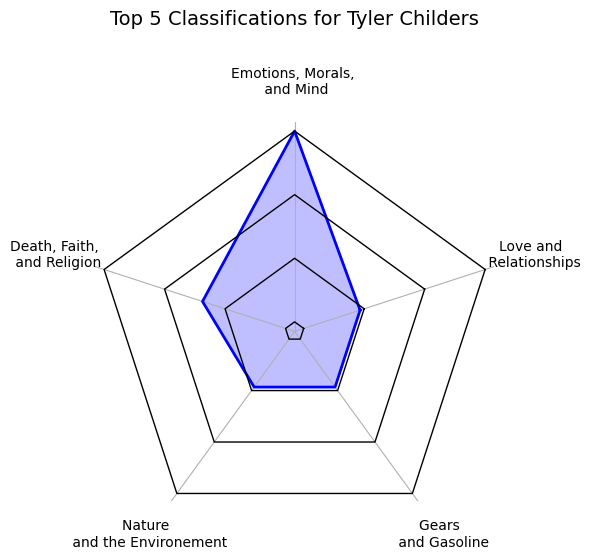

In [40]:
wordcloud_radar_visual('Tyler Childers')

### Waylon Jennings

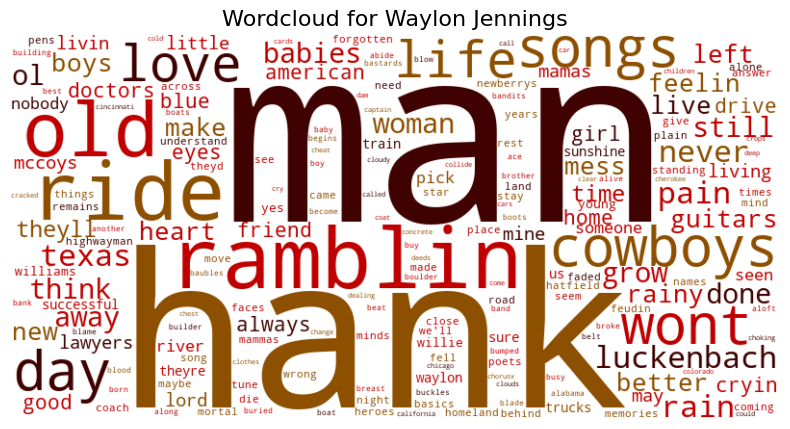

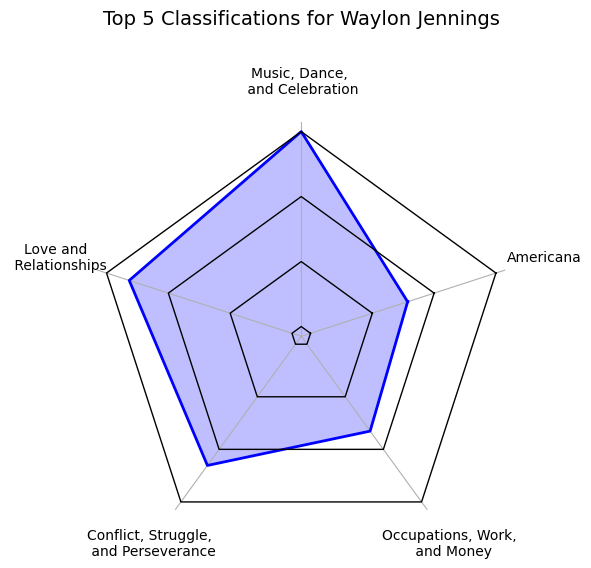

In [41]:
wordcloud_radar_visual('Waylon Jennings')

### Willie Nelson

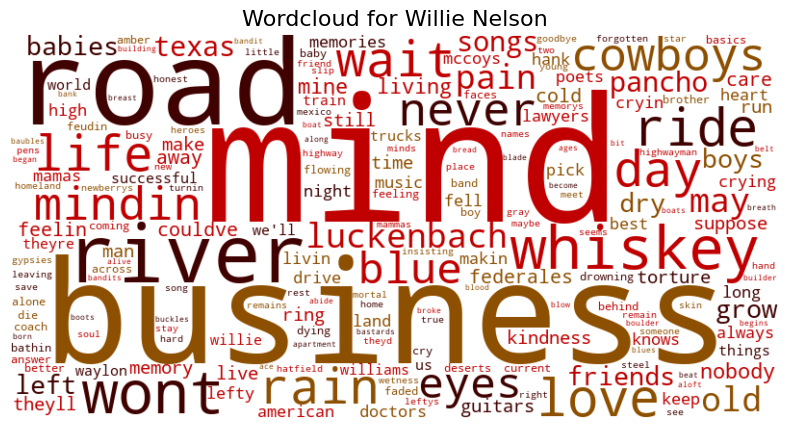

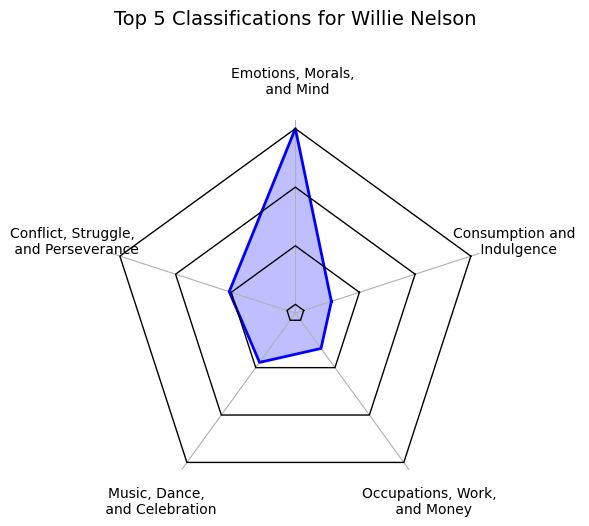

In [42]:
wordcloud_radar_visual('Willie Nelson')

### Zac Brown Band

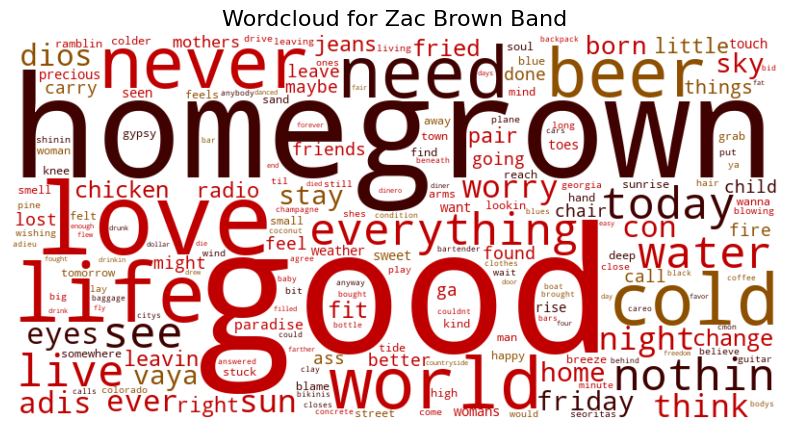

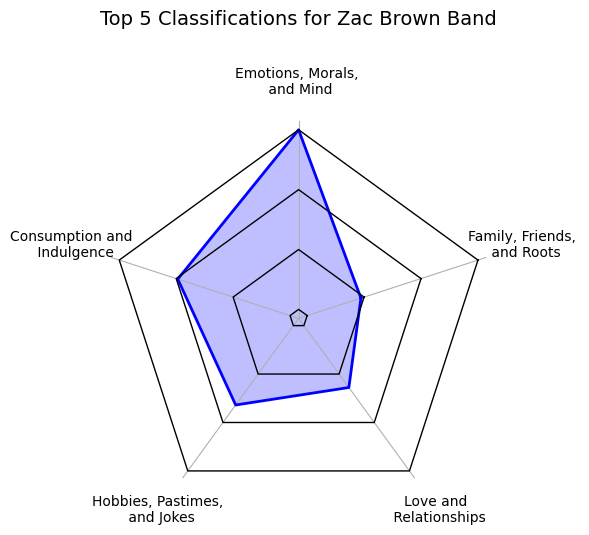

In [44]:
wordcloud_radar_visual('Zac Brown Band')

### Zach Bryan

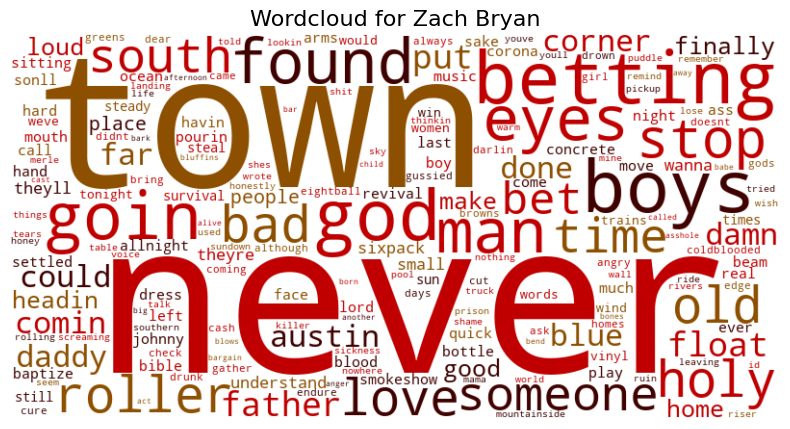

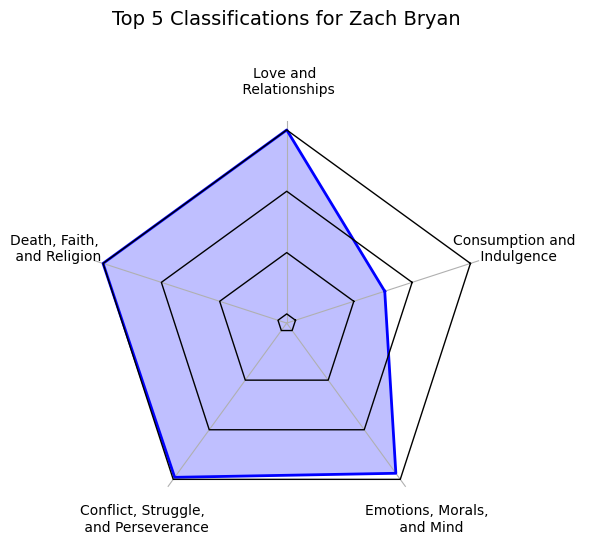

In [45]:
wordcloud_radar_visual('Zach Bryan')

## That's A Wrap

![Alt text](Images/A_Note.png)